In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
%matplotlib inline

In [2]:
from bokeh.io import output_notebook, show
from bokeh.models import (
  GMapPlot, GMapOptions, ColumnDataSource, Circle, DataRange1d, PanTool, WheelZoomTool, BoxSelectTool
)

In [3]:
output_notebook()

Loading BokehJS ...

In [5]:
!ls data/

_97bd1c1e5df9537bb13398c9898deed7_detroit-blight-violations.csv
buildings.csv
_dcebfb2135a2bf5a6392493bd61aba22_detroit-311.csv
_dcebfb2135a2bf5a6392493bd61aba22_detroit-crime.csv
_dcebfb2135a2bf5a6392493bd61aba22_detroit-demolition-permits.tsv


In [6]:
crime_data = pd.read_csv("data/_dcebfb2135a2bf5a6392493bd61aba22_detroit-crime.csv")
crime_data.shape

/home/ce/anaconda2/envs/shader_env/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(119931, 17)

In [7]:
crime_data.head()

,ROWNUM,CASEID,INCINO,CATEGORY,OFFENSEDESCRIPTION,STATEOFFENSEFILECLASS,INCIDENTDATE,HOUR,SCA,PRECINCT,COUNCIL,NEIGHBORHOOD,CENSUSTRACT,ADDRESS,LON,LAT,LOCATION
0,53256,1953933,1506030028.1,ASSAULT,ASSAULT AND BATTERY/SIMPLE ASSAULT,13001.0,06/03/2015 12:00:00 AM,2,1007.0,10.0,City Council District 5,PETOSKEY-OTSEGO,5334.0,09100 PETOSKEY,-83.1221,42.3678,"PETOSKEY\n09100\n(42.3676, -83.1219)"
1,17631,1917717,1503010158.1,LARCENY,LARCENY - PARTS AND ACCESSORIES FROM VEHICLE,23006.0,03/01/2015 12:00:00 AM,9,608.0,6.0,City Council District 7,GRANDALE,5452.0,00 PLYMOUTH AND MANSFIELD,-83.2035,42.3724,"00 PLYMOUTH AND MANSFIELD\n(42.3725, -83.2033)"
2,11207,1910955,1502080223.1,STOLEN VEHICLE,VEHICLE THEFT,24001.0,02/08/2015 12:00:00 AM,18,1105.0,11.0,City Council District 3,OUTER DRIVE VAN DYKE,5051.0,00 E 7 MILE VAN DYKE,-83.0241,42.4338,"00 E 7 MILE VAN DYKE\n(42.4339, -83.0241)"
3,116589,2018186,1511090188.1,WEAPONS OFFENSES,WEAPONS OFFENSE (OTHER),52003.0,11/09/2015 12:00:00 AM,12,210.0,2.0,City Council District 6,TIREMAN,NaN,06600 BARTON,-83.1381,42.3496,"BARTON\n06600\n(42.3494, -83.1379)"
4,85790,1986862,1508239803.1,LARCENY,LARCENY - PARTS AND ACCESSORIES FROM VEHICLE,23006.0,08/14/2015 12:00:00 AM,7,309.0,3.0,City Council District 6,WEST CANFIELD,5204.0,00900 W WILLIS,-83.0692,42.3481,"W WILLIS\n00900\n(42.3481, -83.0693)"


In [8]:
crime_data.columns

Index([u'ROWNUM', u'CASEID', u'INCINO', u'CATEGORY', u'OFFENSEDESCRIPTION',
       u'STATEOFFENSEFILECLASS', u'INCIDENTDATE', u'HOUR', u'SCA', u'PRECINCT',
       u'COUNCIL', u'NEIGHBORHOOD', u'CENSUSTRACT', u'ADDRESS', u'LON', u'LAT',
       u'LOCATION'],
      dtype='object')

In [9]:
demolition_data = pd.read_csv("data/_dcebfb2135a2bf5a6392493bd61aba22_detroit-demolition-permits.tsv", sep='\t')
demolition_data.head()

,PERMIT_NO,PERMIT_APPLIED,PERMIT_ISSUED,PERMIT_EXPIRES,SITE_ADDRESS,BETWEEN1,PARCEL_NO,LOT_NUMBER,SUBDIVISION,CASE_TYPE,...,CONTRACTOR_ADDRESS1,CONTRACTOR_ADDRESS2,CONTRACTOR_CITY,CONTRACTOR_STATE,CONTRACTOR_ZIP,CONDITION_FOR_APPROVAL,site_location,owner_location,contractor_location,geom
0,BLD2015-03955,8/28/15,8/28/15,NaN,4331 BARHAM,BETWEEN VOIGHT AND WAVENEY,21 65525-6,S15,NaN,BLD,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"4331 BARHAM\nDetroit, MI\n(42.394106, -82.9474)","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
1,BLD2015-04083,8/28/15,8/28/15,NaN,9707 BESSEMORE,BETWEEN VINTON AND GRATIOT,19 2312.,40,NaN,BLD,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"9707 BESSEMORE\nDetroit, MI\n(42.395122, -83.0...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
2,BLD2015-03976,8/28/15,8/28/15,NaN,5315 BERKSHIRE,BETWEEN SOUTHAMPTON AND FRANKFORT,21 69321.,445,NaN,BLD,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"5315 BERKSHIRE\nDetroit, MI\n(42.40322, -82.94...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
3,BLD2015-03781,8/28/15,8/28/15,NaN,16670 BRINGARD DR,BETWEEN CUSHING AND SHAKESPEARE,21 25930.,97,NaN,BLD,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"16670 BRINGARD DR\nDetroit, MI\n(42.44664, -82...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
4,BLD2015-03677,8/28/15,8/28/15,NaN,1454 BEATRICE,BETWEEN TORONTO AND GILROY,20 12871.012,21,NaN,BLD,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"1454 BEATRICE\nDetroit, MI\n(42.276956, -83.14...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN


In [15]:
demolition_data.columns

Index([u'PERMIT_NO', u'PERMIT_APPLIED', u'PERMIT_ISSUED', u'PERMIT_EXPIRES',
       u'SITE_ADDRESS', u'BETWEEN1', u'PARCEL_NO', u'LOT_NUMBER',
       u'SUBDIVISION', u'CASE_TYPE', u'CASE_DESCRIPTION', u'LEGAL_USE',
       u'ESTIMATED_COST', u'PARCEL_SIZE', u'PARCEL_CLUSTER_SECTOR', u'STORIES',
       u'PARCEL_FLOOR_AREA', u'PARCEL_GROUND_AREA', u'PRC_AKA_ADDRESS',
       u'BLD_PERMIT_TYPE', u'PERMIT_DESCRIPTION', u'BLD_PERMIT_DESC',
       u'BLD_TYPE_USE', u'RESIDENTIAL', u'DESCRIPTION', u'BLD_TYPE_CONST_COD',
       u'BLD_ZONING_DIST', u'BLD_USE_GROUP', u'BLD_BASEMENT', u'FEE_TYPE',
       u'CSM_CASENO', u'CSF_CREATED_BY', u'SEQ_NO', u'PCF_AMT_PD',
       u'PCF_AMT_DUE', u'PCF_UPDATED', u'OWNER_LAST_NAME', u'OWNER_FIRST_NAME',
       u'OWNER_ADDRESS1', u'OWNER_ADDRESS2', u'OWNER_CITY', u'OWNER_STATE',
       u'OWNER_ZIP', u'CONTRACTOR_LAST_NAME', u'CONTRACTOR_FIRST_NAME',
       u'CONTRACTOR_ADDRESS1', u'CONTRACTOR_ADDRESS2', u'CONTRACTOR_CITY',
       u'CONTRACTOR_STATE', u'CONTRACTO

In [139]:
demolition_data.shape

(7133, 55)

In [197]:
demolition_data.CASE_DESCRIPTION.unique()

array(['Building Permit'], dtype=object)

In [17]:
demolition_data.CASE_TYPE.unique()

array(['BLD'], dtype=object)

In [194]:
demolition_data.PERMIT_DESCRIPTION.unique()

array([nan, 'Dismantle'], dtype=object)

In [10]:
incident_data = pd.read_csv("data/_97bd1c1e5df9537bb13398c9898deed7_detroit-blight-violations.csv")
incident_data.head()

/home/ce/anaconda2/envs/shader_env/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (6,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,TicketID,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,...,AdminFee,LateFee,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress
0,26288,05000001DAH,Department of Public Works,"Group, LLC, Grand Holding",2566,GRAND BLVD,743,"Beaubien, Ste. 201",Detroit,MI,...,$20.00,$150.00,$10.00,$0.00,$1680.00,PAID IN FULL,0.0,0,"2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...","743 Beaubien\nDetroit, MI 48226\n(42.333730630..."
1,19800,05000025DAH,Department of Public Works,"JACKSON, RAECHELLE",19014,ASHTON,20501,HEYDEN,DETROIT,MI,...,$20.00,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"19014 ASHTON\nDetroit, MI\n(42.429390762000025...","20501 HEYDEN\nDETROIT, MI 48219\n(42.442177633..."
2,19804,05000026DAH,Department of Public Works,"TALTON, CAROL ANN",18735,STAHELIN,18735,STAHELI N,DETROIT,MI,...,$20.00,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"18735 STAHELIN\nDetroit, MI\n(42.4287074590000...","18735 STAHELI N\nDETROIT, MI 48219\n(42.428707..."
3,20208,05000027DAH,Department of Public Works,"BONNER, DARRYL E.",20125,MONICA,25335,PEEKSKILL,SOUTHFIELD,MI,...,$20.00,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"20125 MONICA\nDetroit, MI\n(42.44169828400004,...","25335 PEEKSKILL\nSOUTHFIELD, MI 48043\n(42.475..."
4,20211,05000028DAH,Department of Public Works,"GREGORY, JAMES LEE",17397,PRAIRIE,17397,PRAIRIE,DETROIT,MI,...,$20.00,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...","17397 PRAIRIE\nDETROIT, MI 48221\n(42.42031769..."


In [5]:
incident_data.columns

Index([u'TicketID', u'TicketNumber', u'AgencyName', u'ViolName',
       u'ViolationStreetNumber', u'ViolationStreetName',
       u'MailingStreetNumber', u'MailingStreetName', u'MailingCity',
       u'MailingState', u'MailingZipCode', u'NonUsAddressCode', u'Country',
       u'TicketIssuedDT', u'TicketIssuedTime', u'HearingDT', u'CourtTime',
       u'ViolationCode', u'ViolDescription', u'Disposition', u'FineAmt',
       u'AdminFee', u'LateFee', u'StateFee', u'CleanUpCost', u'JudgmentAmt',
       u'PaymentStatus', u'Void', u'ViolationCategory', u'ViolationAddress',
       u'MailingAddress'],
      dtype='object')

In [6]:
incident_data.shape

(307804, 31)

In [7]:
incident_data.iloc[0, :]

TicketID                                                             26288
TicketNumber                                                   05000001DAH
AgencyName                                      Department of Public Works
ViolName                                         Group, LLC, Grand Holding
ViolationStreetNumber                                                 2566
ViolationStreetName                                       GRAND BLVD      
MailingStreetNumber                                                    743
MailingStreetName                                       Beaubien, Ste. 201
MailingCity                                                        Detroit
MailingState                                                            MI
MailingZipCode                                                       48226
NonUsAddressCode                                                       NaN
Country                                                                NaN
TicketIssuedDT           

In [7]:
incident_data.iloc[:10, :].ViolationAddress

0    2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...
1    19014 ASHTON\nDetroit, MI\n(42.429390762000025...
2    18735 STAHELIN\nDetroit, MI\n(42.4287074590000...
3    20125 MONICA\nDetroit, MI\n(42.44169828400004,...
4    17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...
5    17153 NORTHLAWN\nDetroit, MI\n(42.417888685000...
6    17153 NORTHLAWN\nDetroit, MI\n(42.417888685000...
7    17517 NORTHLAWN\nDetroit, MI\n(42.420899430000...
8    18610 SANTA\nDetroit, MI\n(42.33168113800008, ...
9    18498 MONICA\nDetroit, MI\n(42.42762085700008,...
Name: ViolationAddress, dtype: object

In [11]:
inci_df = incident_data.copy()
geo_pat = re.compile('\((.+), (.+)\)')
inci_df['lat'] = inci_df.ViolationAddress.apply(lambda x: float(re.search(geo_pat, x).group(1)))
inci_df['lon'] = inci_df.ViolationAddress.apply(lambda x: float(re.search(geo_pat, x).group(2)))

In [12]:
inci_df['geo'] = inci_df.ViolationAddress.apply(lambda x: re.search('\((.+)\)', x).group(1))

In [11]:
inci_df.geo.describe()

count                                    307804
unique                                    96314
top       42.33168113800008, -83.04799603699996
freq                                      21114
Name: geo, dtype: object

In [12]:
inci_df.groupby('geo').count()

,TicketID,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,...,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress,lat,lon
geo,,,,,,,,,,,,,,,,,,,,,
"42.25534205100007, -83.16098999399998",1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
"42.25782406600007, -83.16337406499997",1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,0,1,1,1,1,1
"42.258213537000074, -83.16396403299996",2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,0,2,2,2,2,2
"42.25928285400005, -83.16557146599996",3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
"42.25939655900004, -83.16570803899998",3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,1,3,3,3,3,3
"42.25957322900007, -83.16594134899998",3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
"42.26076743800007, -83.16112681699997",37,37,37,37,37,37,37,37,37,37,...,37,37,37,37,17,37,37,37,37,37
"42.261923884000055, -83.15849299899998",5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,0,5,5,5,5,5
"42.26284455800004, -83.16721001099995",1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,0,1,1,1,1,1


In [4]:
inci_df[['lat', 'lon']].describe()

,lat,lon
count,307804.000000,307804.000000
mean,42.384316,-83.108853
std,0.037249,0.092597
min,42.255342,-83.287664
25%,42.353541,-83.187774
50%,42.387271,-83.118802
75%,42.415887,-83.047996
max,42.449453,-82.910649


In [6]:
inci_df.head()

,TicketID,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,...,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress,lat,lon
0,26288,05000001DAH,Department of Public Works,"Group, LLC, Grand Holding",2566,GRAND BLVD,743,"Beaubien, Ste. 201",Detroit,MI,...,$10.00,$0.00,$1680.00,PAID IN FULL,0.0,0,"2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...","743 Beaubien\nDetroit, MI 48226\n(42.333730630...",42.363182,-83.091677
1,19800,05000025DAH,Department of Public Works,"JACKSON, RAECHELLE",19014,ASHTON,20501,HEYDEN,DETROIT,MI,...,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"19014 ASHTON\nDetroit, MI\n(42.429390762000025...","20501 HEYDEN\nDETROIT, MI 48219\n(42.442177633...",42.429391,-83.220394
2,19804,05000026DAH,Department of Public Works,"TALTON, CAROL ANN",18735,STAHELIN,18735,STAHELI N,DETROIT,MI,...,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"18735 STAHELIN\nDetroit, MI\n(42.4287074590000...","18735 STAHELI N\nDETROIT, MI 48219\n(42.428707...",42.428707,-83.227548
3,20208,05000027DAH,Department of Public Works,"BONNER, DARRYL E.",20125,MONICA,25335,PEEKSKILL,SOUTHFIELD,MI,...,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"20125 MONICA\nDetroit, MI\n(42.44169828400004,...","25335 PEEKSKILL\nSOUTHFIELD, MI 48043\n(42.475...",42.441698,-83.145018
4,20211,05000028DAH,Department of Public Works,"GREGORY, JAMES LEE",17397,PRAIRIE,17397,PRAIRIE,DETROIT,MI,...,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...","17397 PRAIRIE\nDETROIT, MI 48221\n(42.42031769...",42.420318,-83.145328


## plotting the incident data

### simple scatter plot - 1000 point - matplotlib

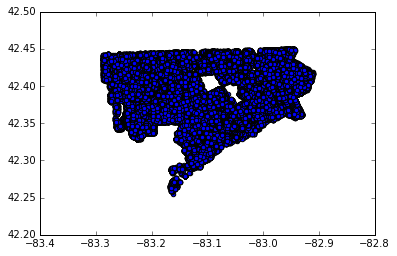

In [72]:
plot_df = inci_df.sample(1000)
plt.scatter(inci_df.lon, inci_df.lat)

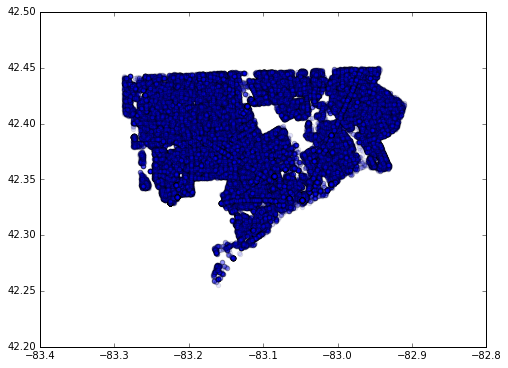

In [78]:
plt.figure(figsize=(8, 6))

plt.scatter(inci_df.lon, inci_df.lat, alpha=0.1)

### simple scatter plot - 1000 point - bokeh

In [70]:
plot_df = inci_df.sample(1000)

p = figure()
p.scatter(plot_df['lon'], plot_df['lat'])
show(p)

### simple scatter plot - 10000 point - bokeh

In [81]:
plot_df = inci_df.sample(10000)

p = figure()
p.scatter(plot_df['lon'], plot_df['lat'], alpha=0.1)
show(p)

### simple scatter plot - 100000 point - bokeh

In [84]:
%%time 
plot_df = inci_df.sample(100000)

p = figure()
p.scatter(plot_df['lon'], plot_df['lat'], alpha=0.1)
show(p)

CPU times: user 5.9 s, sys: 355 ms, total: 6.26 s
Wall time: 6.01 s


In [16]:
plot_width  = int(750)
plot_height = int(plot_width//1.2)

In [35]:
import datashader as ds
import datashader.transfer_functions as tf

In [49]:
detroit = x_range, y_range = ((inci_df.lon.min(), inci_df.lon.max()), (inci_df.lat.min(), inci_df.lat.max()))

In [50]:
detroit

((-83.287663790999943, -82.910649288999934),
 (42.255342051000071, 42.449453100000028))

In [59]:
inci_df.shape

(307804, 34)

In [85]:
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(inci_df, 'lon', 'lat', ds.count('TicketID'))

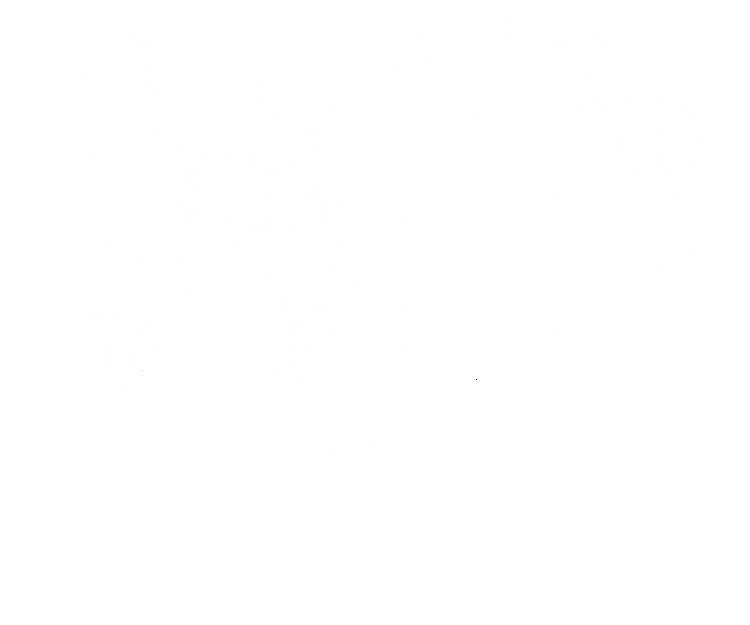

In [87]:
img = tf.interpolate(agg, cmap=["white", "darkblue"], how='linear')
img

In [55]:
import numpy as np

def histogram(x,colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)

In [66]:
histogram(agg.values)

min: 0, max: 21114


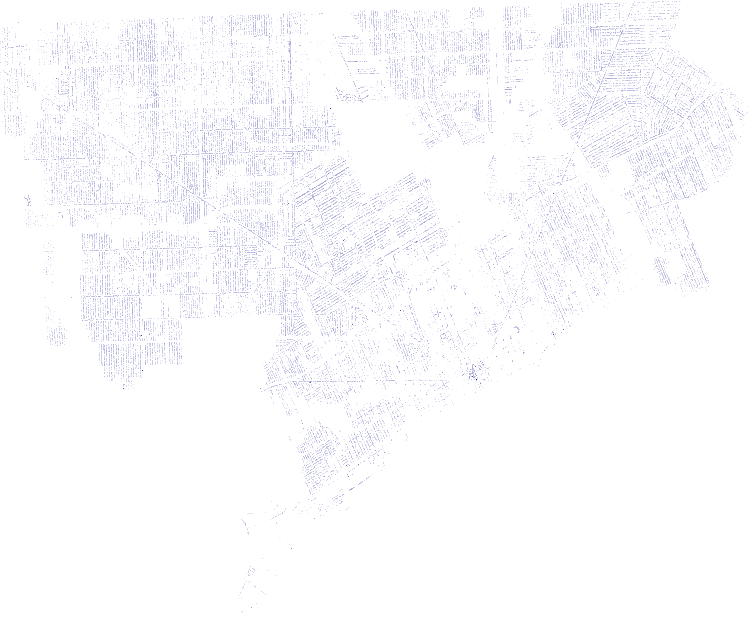

In [67]:
img = tf.interpolate(agg, cmap=["white", "darkblue"], how='log')
img

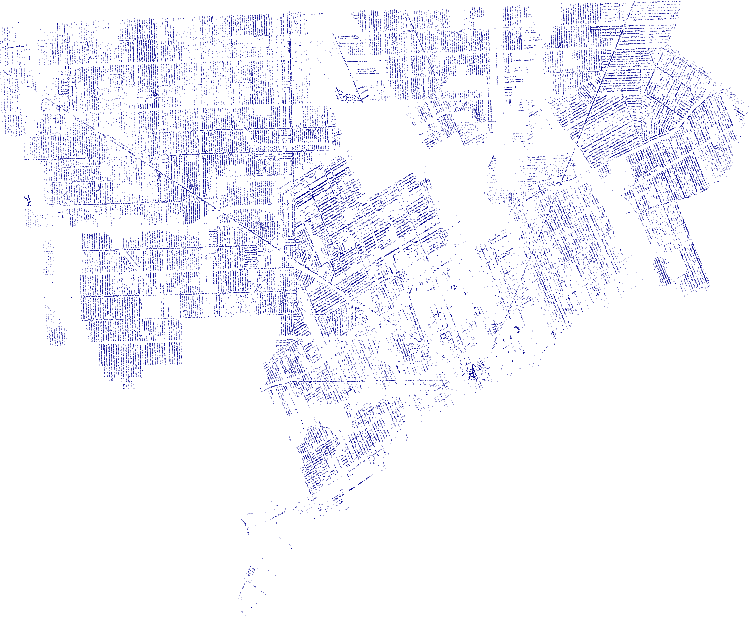

In [65]:
img = tf.interpolate(agg, cmap=["white", "darkblue"], how='eq_hist')
img

In [94]:
## convert from lat, lon to Web Mercator coordinates
import math
def toWebMercator(xLon, yLat):
    # Check if coordinate out of range for Latitude/Longitude
    if (abs(xLon) > 180) or (abs(yLat) > 90):
        return
 
    semimajorAxis = 6378137.0  # WGS84 spheriod semimajor axis
    east = xLon * 0.017453292519943295
    north = yLat * 0.017453292519943295
 
    northing = 3189068.5 * math.log((1.0 + math.sin(north)) / (1.0 - math.sin(north)))
    easting = semimajorAxis * east
 
    return [easting, northing]

def LonToWebMercator(xLon):
    # Check if coordinate out of range for Latitude/Longitude
    if (abs(xLon) > 180):
        return
 
    semimajorAxis = 6378137.0  # WGS84 spheriod semimajor axis
    east = xLon * 0.017453292519943295
    easting = semimajorAxis * east
 
    return easting

def LatToWebMercator(yLat):
        # Check if coordinate out of range for Latitude/Longitude
    if (abs(yLat) > 90):
        return
 
    north = yLat * 0.017453292519943295
    northing = 3189068.5 * math.log((1.0 + math.sin(north)) / (1.0 - math.sin(north)))
 
    return northing

In [95]:
inci_df['x'] = inci_df.lon.apply(LonToWebMercator)
inci_df['y'] = inci_df.lat.apply(LatToWebMercator)

### add interactivity with bokeh

In [91]:
from bokeh.plotting import figure, output_notebook, show

def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

In [101]:
import datashader as ds
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from IPython.core.display import HTML, display

background = "white"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(inci_df, 'x', 'y', )
    img = tf.interpolate(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)

In [103]:
from bokeh.tile_providers import STAMEN_TERRAIN

detroit = x_range, y_range = ((inci_df.x.min(), inci_df.x.max()), (inci_df.y.min(), inci_df.y.max()))
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
export(create_image(*detroit),"detroit")
InteractiveImage(p, create_image)

### only show 90 percentile

In [104]:
import numpy as np
from functools import partial

def create_image90(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(inci_df, 'x', 'y', )
    img = tf.interpolate(agg.where(agg>np.percentile(agg,90)), cmap=inferno, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)
    
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
export(create_image(*detroit),"detroit_90th")
InteractiveImage(p, create_image90)

In [5]:
#cluster based on lat and lon
from sklearn.cluster import DBSCAN 
from geopy.distance import distance

In [13]:
distance((inci_df.lat.min(), inci_df.lon.min()), (inci_df.lat.max(), inci_df.lon.max()))

Distance(37.8129627639)

In [15]:
distance((42.3631, -83.0916), (42.3632, -83.0916)) * 1000

Distance(11.1080340142)

In [208]:
distance((42.42036033, -83.08840315), (42.42035803, -83.08847805)).meters

6.169784535621874

In [32]:
distance((42.1234, -83.4321), (42.1234, -83.4322)).meters

8.269021479914125

In [65]:
inci_df[['lat', 'lon']].shape

(307804, 2)

### generate a list of buildings from blight violation data:
- cluster geo locations
- use the centroid of each cluster as the building location
- define a building as a rectangle of size xxx

In [84]:
from sklearn.metrics import euclidean_distances

In [89]:
euclidean_distances((42.1234, -83.4321), (42.1234, -83.4322))

/usr/local/lib/python2.7/dist-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/usr/local/lib/python2.7/dist-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


array([[ 0.0001]])

In [12]:
def get_distance(A, B):
    return distance((A[0], A[1]), (B[0], B[1])).meters

In [24]:
# model = DBSCAN(eps=80, metric=get_distance,) 
model = DBSCAN(eps=0.0001, min_samples=2, algorithm='kd_tree', leaf_size=100)

In [25]:
model.fit(inci_df[['lat', 'lon']])

DBSCAN(algorithm='kd_tree', eps=0.0001, leaf_size=100, metric='euclidean',
    min_samples=2, p=None, random_state=None)

In [128]:
get_distance([-83.15355317,  42.41751996],
       [-83.15363728,  42.41760868])

9.46721230905962

In [45]:
# check cluster size and contents
mask = (model.labels_ == 600)
inci_df[['lon','lat']].values[mask]

array([[-83.04799604,  42.33168114],
       [-83.04799604,  42.33168114],
       [-83.04799604,  42.33168114],
       ..., 
       [-83.04799604,  42.33168114],
       [-83.04799604,  42.33168114],
       [-83.04799604,  42.33168114]])

In [48]:
for i in inci_df[['lon','lat']].values[mask]:
    for j in inci_df[['lon','lat']].values[mask]:
        print get_distance(i, j)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


KeyboardInterrupt: 

number of clusters: 11001


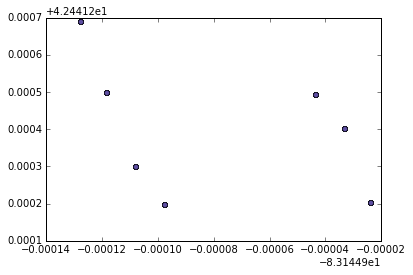

In [119]:
# X = inci_df[['lon','lat']].values
# labels = model.labels_
# unique_labels = set(labels)
# location_mask = ()
# print "number of clusters: %d" %len(unique_labels)
# colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
# for k, col in zip(unique_labels, colors):
#     if k == -1:
#         # Black used for noise.
#         col = 'k'
#         continue
#     class_member_mask = (labels == k)

#     xy = X[class_member_mask ]
#     plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
#              markeredgecolor='k', markersize=5)

In [29]:
print sum(model.labels_ == -1), len(set(model.labels_))
print sum(model.labels_ == -1) + len(set(model.labels_)) - 1

21833 48346
70178


In [41]:
raw_buildings = pd.concat([inci_df[['lon','lat']], pd.DataFrame(model.labels_, columns=['label'])], axis=1)
clustered_buildings = raw_buildings[raw_buildings.label >= 0]
building_df = pd.concat([clustered_buildings.groupby('label').mean(), raw_buildings[raw_buildings.label == -1]], ignore_index=True)
building_df.drop('label', axis=1, inplace=True)
# building_df['No'] = range(building_df.shape[0])

In [39]:
raw_buildings.label.value_counts()

-1        21833
 6        21114
 86        4467
 75        2003
 366       1713
 535       1372
 665       1142
 196        755
 395        742
 1336       639
 1386       626
 140        490
 617        414
 1347       326
 2174       306
 1330       206
 70         203
 1060       154
 858        148
 9509       148
 17         147
 268        146
 35880      130
 1784       123
 5875        94
 40542       93
 923         91
 40541       91
 6921        91
 141         88
          ...  
 42415        2
 44462        2
 40360        2
 9407         2
 44888        2
 32322        2
 34653        2
 40798        2
 38751        2
 30785        2
 5305         2
 7352         2
 24390        2
 19890        2
 20292        2
 30531        2
 32578        2
 28480        2
 38495        2
 36444        2
 46683        2
 42585        2
 30133        2
 28086        2
 7608         2
 3514         2
 13757        2
 22087        2
 42671        2
 21198        2
Name: label, dtype: int6

In [42]:
building_df.head()

,lat,lon
0,42.363182,-83.091677
1,42.429391,-83.220394
2,42.428707,-83.227548
3,42.441730,-83.144975
4,42.417889,-83.153637


In [192]:
def get_buildings(lat, lon, r=20):
    """Given lat, lon, return building No. from building_df.
    Building is defined as a circle of radius 20m
    """
    dist = building_df.apply(lambda x: get_distance((x.lat, x.lon), (lat, lon)), axis=1)
    return dist[dist < r]

In [193]:
get_buildings(42.363186, -83.091669)

0    0.064213
dtype: float64

In [201]:
building_df.to_csv("./data/buildings.csv", index_label='No')

In [202]:
!head data/buildings.csv

No,lat,lon
0,42.3631855172,-83.0916685714
1,42.429329435,-83.2203889691
2,42.428928697,-83.2275286351
3,42.4416705907,-83.1449917133
4,42.418293712,-83.1535993829
5,42.4209649475,-83.1537419477
6,42.331681138,-83.047996037
7,42.427743921,-83.1445513112
8,42.3528973019,-83.2234853425


In [7]:
pd.read_csv("./data/buildings.csv").shape

(40269, 3)